In [ ]:
!pip install wordcloud

In [ ]:
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator
import pandas as pd
import matplotlib.pyplot as plt
dataset = "http://data.insideairbnb.com/canada/on/toronto/2023-03-09/data/listings.csv.gz"
df = pd.read_csv(dataset)

In [ ]:
df.iloc[10]["description"]

NameError: name 'df' is not defined

In [ ]:
df.shape

(17997, 75)

In [ ]:
df.description.isnull().sum()

246

In [ ]:
17997-246

17751

In [ ]:
description=df.dropna(subset=["description"],axis=0)['description']

In [ ]:
df.description.isnull().sum()

246

In [ ]:
df.dropna(subset=["description"],axis=0).shape

(17751, 75)

In [ ]:
all_description=" ".join(s for s in description)

In [ ]:
all_description

'This large, family home is located in one of Toronto\'s most vibrant downtown neighbourhoods. The five-bedroom, three-bath house is newly renovated and complete with all the amenities you\'ll need for a fabulous time in the city.<br /><br /><b>The space</b><br />Visit Toronto with this fabulous furnished home as your base!<br /><br />This lovely home is surrounded by gardens in the back and front. Inside, you\'ll find a large open space with a modern kitchen and bright living and dining room. There are two floors up - a master bedroom with a king-size bed and two kids rooms, each with a single bed. The attic is a private space with a king-sized bed, fold-out single couch and a private deck. The basement is fully-finished with a private room and bath, as well as a playroom with another single couch that doubles as a sleeping space. The house will comfortably sleep 10. <br /><br />For kids of all ages: we have toys, a very cool tree fort, and many great parks and playgrounds nearby.<br 

23-01-2025

Exploring Text Data

about the data

In [ ]:
# Load the dataset
import pandas as pd

# Provide the correct file path (remove extra quotes)
dataset = pd.read_csv("/content/tweets.csv", encoding='ISO-8859-1')

# Display the first 3 rows of the dataset
print(dataset.head(3))


   Unnamed: 0  X                                               text  \
0           1  1  RT @rssurjewala: Critical question: Was PayTM ...   
1           2  2  RT @Hemant_80: Did you vote on #Demonetization...   
2           3  3  RT @roshankar: Former FinSec, RBI Dy Governor,...   

   favorited  favoriteCount replyToSN              created  truncated  \
0      False              0       NaN  2016-11-23 18:40:30      False   
1      False              0       NaN  2016-11-23 18:40:29      False   
2      False              0       NaN  2016-11-23 18:40:03      False   

   replyToSID            id  replyToUID  \
0         NaN  8.014957e+17         NaN   
1         NaN  8.014957e+17         NaN   
2         NaN  8.014955e+17         NaN   

                                        statusSource       screenName  \
0  <a href="http://twitter.com/download/android" ...  HASHTAGFARZIWAL   
1  <a href="http://twitter.com/download/android" ...   PRAMODKAUSHIK9   
2  <a href="http://twitter.com

In [ ]:
dataset.shape

(14940, 16)

In [ ]:
pd.read_csv?

In [ ]:
def gen_freq(text):
    word_list=[]
    for tw_words in text.split():
        word_list.extend(tw_words)
    word_freq = pd.Series(word_list).value_counts()
    word_freq[:10]
    return word_freq
word_freq=gen_freq(dataset.text.str)
word_freq

,count
RT,11053
to,7650
is,5152
in,4491
the,4331
...,...
#News,1
notes|,1
https://t.co/ECl4oIzdHA,1
https://t.co/9MjFtLtCtR,1


In [ ]:
word_freq = gen_freq(dataset.text.str)
word_freq

,count
RT,11053
to,7650
is,5152
in,4491
the,4331
...,...
#News,1
notes|,1
https://t.co/ECl4oIzdHA,1
https://t.co/9MjFtLtCtR,1


In [ ]:
!pip install wordcloud

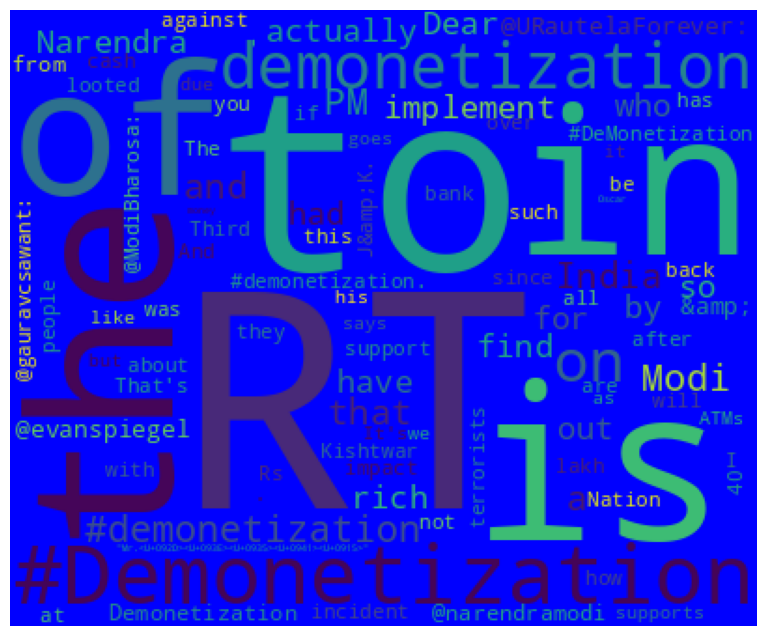

In [ ]:
#import libraries
import matplotlib.pyplot as plt
from wordcloud import WordCloud
#generate word cloud
wc = WordCloud(width=400, height=330, max_words=200,
               background_color='Blue').generate_from_frequencies(word_freq)
plt.figure(figsize=(12, 8))
plt.imshow(wc)
plt.axis('off')
plt.show()

Text Cleaning


In [ ]:
 import re
 def clean_text(text):
      #remove RT(rqw text)
      text = re.sub(r'RT', '', text)
      # Fix &
      text = re.sub(r'&amp', '', text)
       # remove panctuations
      text = re.sub(r'[?!.;:#@-]', '', text)
        #convert to lowercase to maintain consistency
      text=text.lower()
      #remove digit
      text = re.sub(r'\d+', '', text)
       #Fix %
      text = re.sub(r'%', '', text)
        #remove html tags
      text = re.sub(r'[<>\\.?https:\\//]*', '', text)
      return text




In [ ]:
plt.imshow?

In [ ]:
wordcloud

stop words removal

In [ ]:
from wordcloud import STOPWORDS
print(STOPWORDS)

{'below', 'himself', "he'll", "mustn't", 'her', 'too', "she'll", 'their', 'few', 'yourself', "wasn't", 'for', 'this', 'therefore', 'just', 'those', 'during', 'most', 'http', 'off', "shouldn't", 'they', 'theirs', 'however', 'have', 'whom', 'each', 'such', "why's", "where's", 'had', "they'd", 'some', 'under', "you'll", 'is', "don't", "they'll", 'can', "shan't", 'these', 'above', "we'll", 'has', 'me', 'yourselves', 'would', 'myself', 'ever', "won't", 'own', "didn't", 'no', 'as', 'themselves', 'ours', "can't", 'in', 'cannot', 'be', "we're", 'k', 'on', 'www', "here's", 'once', 'having', 'do', 'nor', 'to', 'same', "we'd", 'when', 'so', 'like', "weren't", 'were', "he's", 'get', "hadn't", 'here', 'all', 'of', "isn't", 'com', 'r', 'again', 'with', 'other', 'an', 'its', 'does', 'my', 'that', "that's", 'been', 'yours', 'from', 'where', 'she', 'and', "doesn't", 'while', 'could', 'was', 'both', 'shall', "how's", "they're", 'after', "we've", 'not', 'should', "you're", 'herself', 'being', 'hers', "ha

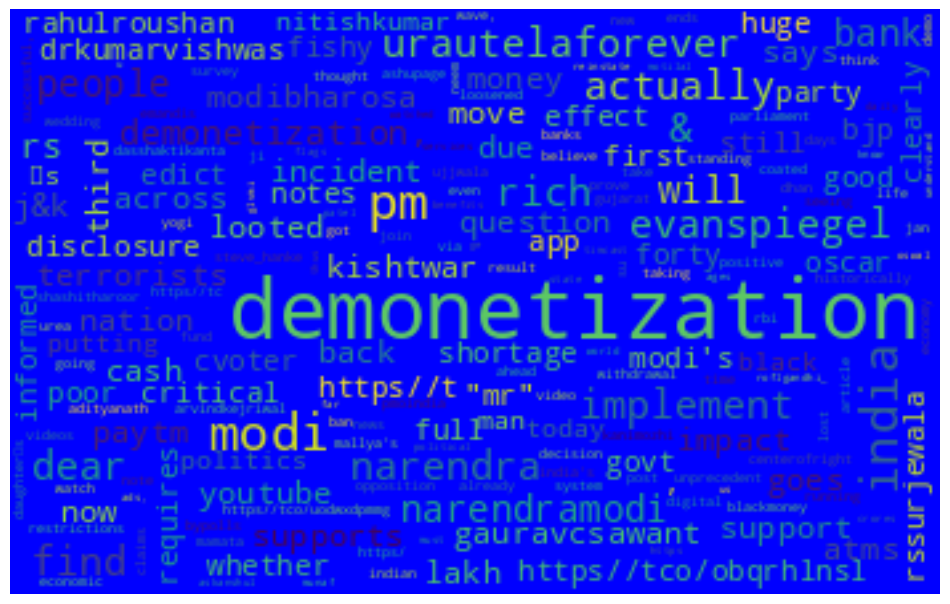

In [ ]:
text = dataset.text.apply(lambda x: clean_text(x))
word_freq = gen_freq(text.str)
word_freq = word_freq.drop(labels=STOPWORDS, errors='ignore')
#generate word cloud
wc = WordCloud(width=350, height=220, max_words=500,
               background_color='Blue').generate_from_frequencies(word_freq)
plt.figure(figsize=(12, 8))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

24-01-2025

POS Tagging in NLP

In [ ]:
import pandas as pd
text = ['Sarah lives in a hut in the village.',
        'She has an apple tree in he background.',
        'The apples are red in colour.']
df = pd.DataFrame(text, columns=['Sentences'])
df

,Sentences
0,Sarah lives in a hut in the village.
1,She has an apple tree in he background.
2,The apples are red in colour.


In [ ]:
!pip install spacy

In [ ]:
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 23.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import spacy

nlp = spacy.load("en_core_web_sm")
token = []
pos = []

for sent in nlp.pipe(df['Sentences']):
  if sent.has_annotation('DEP'):
    token.append([word.text for word in sent])
    pos.append([word.pos_ for word in sent])


In [ ]:
token

[['Sarah', 'lives', 'in', 'a', 'hut', 'in', 'the', 'village', '.'],
 ['She', 'has', 'an', 'apple', 'tree', 'in', 'he', 'background', '.'],
 ['The', 'apples', 'are', 'red', 'in', 'colour', '.']]

In [ ]:
pos

[['PROPN', 'VERB', 'ADP', 'DET', 'NOUN', 'ADP', 'DET', 'NOUN', 'PUNCT'],
 ['PRON', 'VERB', 'DET', 'NOUN', 'NOUN', 'ADP', 'PRON', 'NOUN', 'PUNCT'],
 ['DET', 'NOUN', 'AUX', 'ADJ', 'ADP', 'NOUN', 'PUNCT']]

In [ ]:
df['token']=token
df['pos']=pos

In [ ]:
df.head()

,Sentences,token,pos
0,Sarah lives in a hut in the village.,"[Sarah, lives, in, a, hut, in, the, village, .]","[PROPN, VERB, ADP, DET, NOUN, ADP, DET, NOUN, ..."
1,She has an apple tree in he background.,"[She, has, an, apple, tree, in, he, background...","[PRON, VERB, DET, NOUN, NOUN, ADP, PRON, NOUN,..."
2,The apples are red in colour.,"[The, apples, are, red, in, colour, .]","[DET, NOUN, AUX, ADJ, ADP, NOUN, PUNCT]"


count the particular POS tag

In [ ]:
df['noun'] = df.apply(lambda x: x['pos'].count('NOUN'),axis=1)
df['verb'] = df.apply(lambda x: x['pos'].count('VERB'),axis=1)
df['adj'] = df.apply(lambda x: x['pos'].count('ADJ'),axis=1)
df['punct'] = df.apply(lambda x: x['pos'].count('PUNCT'),axis=1)
df

,Sentences,token,pos,noun,verb,adj,punct
0,Sarah lives in a hut in the village.,"[Sarah, lives, in, a, hut, in, the, village, .]","[PROPN, VERB, ADP, DET, NOUN, ADP, DET, NOUN, ...",2,1,0,1
1,She has an apple tree in he background.,"[She, has, an, apple, tree, in, he, background...","[PRON, VERB, DET, NOUN, NOUN, ADP, PRON, NOUN,...",3,1,0,1
2,The apples are red in colour.,"[The, apples, are, red, in, colour, .]","[DET, NOUN, AUX, ADJ, ADP, NOUN, PUNCT]",2,0,1,1


25-01-2025

EDA_Text_Data

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import csv

df = pd.read_csv('/content/tripadvisor_hotel_reviews.csv', on_bad_lines='skip', engine="python")


df.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5


In [ ]:
df['Rating'].value_counts()

,count
Rating,
5,9054
4,6039
3,2184
2,1793
1,1421


In [ ]:
def ratings(rating):
  if rating>3 and rating<=5:
    return "Positive"
  if rating>3 and rating<=3:
    return "Negative"


In [ ]:
df['Rating'] = df['Rating'].apply(ratings)


In [ ]:
df.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,Positive
1,ok nothing special charge diamond member hilto...,None
2,nice rooms not 4* experience hotel monaco seat...,None
3,"unique, great stay, wonderful time hotel monac...",Positive
4,"great stay great stay, went seahawk game aweso...",Positive


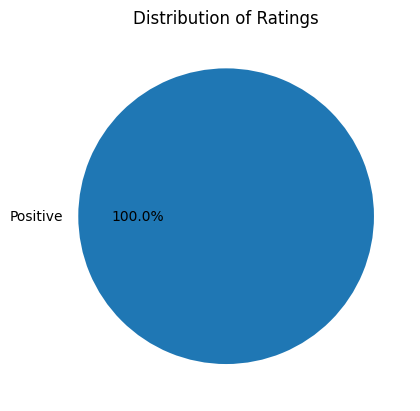

In [ ]:
# Get the value counts and their labels
rating_counts = df['Rating'].value_counts()
labels = rating_counts.index.tolist()

# Plot the pie chart
plt.pie(rating_counts, labels=labels, autopct='%1.1f%%')
plt.title('Distribution of Ratings')
plt.show()


Character  count


In [ ]:
length = len (df['Review'][0])
print(f'Length of a sample review: {length}')

Length of a sample review: 593


In [ ]:
df['Length'] = df['Review'].str.len()
df.head()

,Review,Rating,Length
0,nice hotel expensive parking got good deal sta...,4,593
1,ok nothing special charge diamond member hilto...,2,1689
2,nice rooms not 4* experience hotel monaco seat...,3,1427
3,"unique, great stay, wonderful time hotel monac...",5,600
4,"great stay great stay, went seahawk game aweso...",5,1281


In [ ]:
word_count = df['Review'][0].split()
print(f'Word count in a sample review: {len(word_count)}')

Word count in a sample review: 87


In [ ]:
def word_count(review):
  review_list = review.split()
  return len(review_list)

In [ ]:
df['Word_count'] = df['Review'].apply(word_count)
df.head()

,Review,Rating,Word_count
0,nice hotel expensive parking got good deal sta...,Positive,87
1,ok nothing special charge diamond member hilto...,None,250
2,nice rooms not 4* experience hotel monaco seat...,None,217
3,"unique, great stay, wonderful time hotel monac...",Positive,89
4,"great stay great stay, went seahawk game aweso...",Positive,191


Mean word length

In [ ]:
df['mean_word_length'] = df['Review'].map(lambda rev: np.mean([len(word)
                                                    for word in rev.split()]))
df.head()

,Review,Rating,Word_count,mean_word_length
0,nice hotel expensive parking got good deal sta...,Positive,87,5.804598
1,ok nothing special charge diamond member hilto...,None,250,5.752000
2,nice rooms not 4* experience hotel monaco seat...,None,217,5.571429
3,"unique, great stay, wonderful time hotel monac...",Positive,89,5.730337
4,"great stay great stay, went seahawk game aweso...",Positive,191,5.701571


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
import nltk

nltk.download('punkt_tab')

from nltk import tokenize

np.mean([len(sent) for sent in tokenize.sent_tokenize(df['Review'][0])])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


591.0

In [ ]:
df['mean_sent_length'] = df['Review'].map(lambda rev: np.mean([len(sent)
                                      for sent in tokenize.sent_tokenize(rev)]))
df.head()

,Review,Rating,Length,mean_sent_length
0,nice hotel expensive parking got good deal sta...,4,593,591.0
1,ok nothing special charge diamond member hilto...,2,1689,1687.0
2,nice rooms not 4* experience hotel monaco seat...,3,1427,712.0
3,"unique, great stay, wonderful time hotel monac...",5,600,598.0
4,"great stay great stay, went seahawk game aweso...",5,1281,1279.0


Mean Sentence Length

In [ ]:
import nltk
print(nltk.data.path)
import nltk
import numpy as np
from nltk import tokenize
import pandas as pd

# Download the 'punkt_tab' resource if not already present.
try:
    nltk.data.find('tokenizers/punkt_tab')
except LookupError:
    nltk.download('punkt_tab')

data = {
    'Review': [
        "This is the first review. It has multiple sentences.",
        "Another review here, with more text."
    ],
    'OtherFeature1': [1, 2],
    'OtherFeature2': [3, 4]
}

# Define df
df = pd.DataFrame(data)

# Perform the sentence tokenization and compute mean sentence length
mean_length = np.mean([len(sent) for sent in tokenize.sent_tokenize(df['Review'][0])])
print(f"Mean length of sentences in the first review: {mean_length}")

['/root/nltk_data', '/usr/nltk_data', '/usr/share/nltk_data', '/usr/lib/nltk_data', '/usr/share/nltk_data', '/usr/local/share/nltk_data', '/usr/lib/nltk_data', '/usr/local/lib/nltk_data']


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Mean length of sentences in the first review: 25.5


In [ ]:
features=df.columns.tolist()[2:]
df=df.drop(features,axis=1)
df.head()


,Review,OtherFeature1
0,This is the first review. It has multiple sent...,1
1,"Another review here, with more text.",2


In [ ]:
import pandas as pd

# Assuming 'tripadvisor_hotel_reviews.csv' is the correct file path
df = pd.read_csv('/content/tripadvisor_hotel_reviews.csv', on_bad_lines='skip', engine="python")

features = df.columns.tolist()[2:]
df = df.drop(features, axis=1)
df.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5


In [ ]:
import pandas as pd
import re
from nltk.corpus import stopwords

# Assuming 'tripadvisor_hotel_reviews.csv' is the correct file path
df = pd.read_csv('/content/tripadvisor_hotel_reviews.csv', on_bad_lines='skip', engine="python")

# Define the clean function
def clean(review):
  review = review.lower()
  review = re.sub('[^a-z A-Z 0-9-]+','',review)
  review = [word for word in review if not word in set(stopwords.words('english'))]
  review = ' '.join(review)
  return review

# Apply the clean function to the 'Review' column
df['Review'] = df['Review'].apply(clean)

# Display the first few rows of the updated DataFrame
df.head()

,Review,Rating
0,n c e h e l e x p e n v e p r k n g g ...,4
1,k n h n g p e c l c h r g e n e b e ...,2
2,n c e r n 4 e x p e r e n c e h e l ...,3
3,u n q u e g r e w n e r f u l e h e ...,5
4,g r e g r e w e n e h w k g e w ...,5


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
df['Review'][0]

NameError: name 'df' is not defined

In [ ]:
def corpus(text):
  text_list=text.split()
  return text_list

In [ ]:
from tqdm import trange
corpus=[]
for i in trange(df.shape[0],ncols=150,nrows=10,colour='green',smoothing=0.8):
  corpus+=df['Review'][i]
len(corpus)
from collections import Counter
mostCommon=Counter(corpus).most_common(10)
mostCommon

In [ ]:
import pandas as pd
from tqdm import trange
from collections import Counter

# Assuming 'tripadvisor_hotel_reviews.csv' is the correct file path
df = pd.read_csv('/content/tripadvisor_hotel_reviews.csv', on_bad_lines='skip', engine="python") # Define df here by reading the CSV

corpus=[]
for i in trange(df.shape[0],ncols=150,nrows=10,colour='green',smoothing=0.8):
  corpus

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 20491/20491 [00:00<00:00, 2866569.38it/s]


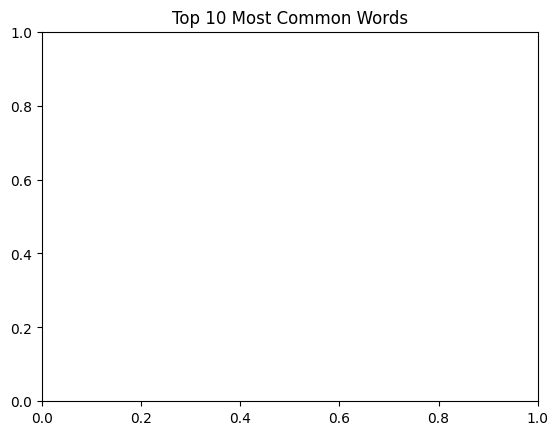

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.barplot(x=freq,y=words)
plt.title('Top 10 Most Common Words')
plt.show()

28-01-2025

In [ ]:
doc_trump="Mr. Trump became president after winning the political election. Though he lost the support of some republican friends, Trump is friends with President Putin"
doc_election="President Trump says Putin had no political interference is the election outcome. He says it was a witchhunt by political parties. He claimed President Putin is a friend who had nothing to do with the election"
doc_putin="Post elections, Vladimir Putin became President of Russia. President Putin had served as the Prime Minister earlier in his political career"
documents=[doc_trump,doc_election,doc_putin]

In [ ]:
documents

['Mr. Trump became president after winning the political election. Though he lost the support of some republican friends, Trump is friends with President Putin',
 'President Trump says Putin had no political interference is the election outcome. He says it was a witchhunt by political parties. He claimed President Putin is a friend who had nothing to do with the election',
 'Post elections, Vladimir Putin became President of Russia. President Putin had served as the Prime Minister earlier in his political career']

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

count_vect = CountVectorizer(stop_words='english')

sparse_matrix = count_vect.fit_transform(documents)

doc_term_matrix = sparse_matrix.todense()
df = pd.DataFrame(doc_term_matrix,
                  columns=count_vect.get_feature_names_out(),
                  index=['doc_trump', 'doc_election', 'doc_putin'])

In [ ]:
df

,career,claimed,earlier,election,elections,friend,friends,interference,lost,minister,...,putin,republican,russia,says,served,support,trump,vladimir,winning,witchhunt
doc_trump,0,0,0,1,0,0,2,0,1,0,...,1,1,0,0,0,1,2,0,1,0
doc_election,0,1,0,2,0,1,0,1,0,0,...,2,0,0,2,0,0,1,0,0,1
doc_putin,1,0,1,0,1,0,0,0,0,1,...,2,0,1,0,1,0,0,1,0,0


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df['Review'])

cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

print(cosine_sim)

[[1.         0.07397129]
 [0.07397129 1.        ]]


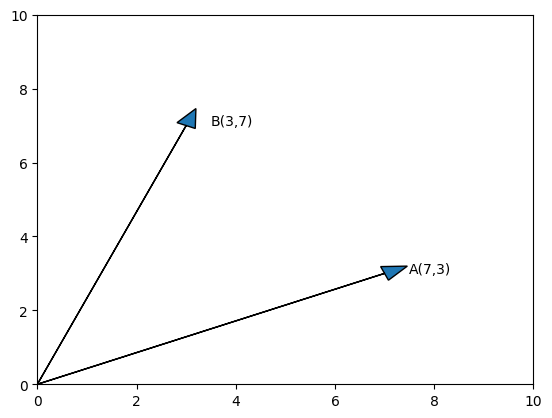

Cosine Similarity between A and B:[cos sim]
Cosine Dissimilarity between A and B:[cos sim]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

A = np.array([7,3])
B = np.array([3,7])
ax = plt.axes()
ax.arrow(0.0, 0.0, A[0], A[1], head_width=0.4, head_length=0.5)
plt.annotate(f"A({A[0]},{A[1]})", xy=(A[0], A[1]),xytext=(A[0]+0.5, A[1]))
ax.arrow(0.0, 0.0, B[0], B[1], head_width=0.4, head_length=0.5)
plt.annotate(f"B({B[0]},{B[1]})", xy=(B[0], B[1]),xytext=(B[0]+0.5, B[1]))
plt.xlim(0,10)
plt.ylim(0,10)
plt.show()
plt.close()

cos_sim = np.dot(A,B)/(np.linalg.norm(A)*np.linalg.norm(B))
print(f"Cosine Similarity between A and B:[cos sim]")
print(f"Cosine Dissimilarity between A and B:[cos sim]")



In [ ]:
A = {1,2,3,4,6}
B = {1,2,5,8,9}
C = A.intersection(B)
D = A.union(B)
print('AnB = ', C)
print('AUB = ', D)
print('J(A,B) =', float(len(C))/float(len(D)))

AnB =  {1, 2}
AUB =  {1, 2, 3, 4, 5, 6, 8, 9}
J(A,B) = 0.25


In [ ]:
def jaccard_similarity(set1, set2):
  intersection = len(set1.intersection(set2))
  union = len(set1.union(set2))
  return intersection / union

set_a = {"Language", "for", "Computer", "NLP", "Science"}
set_b = {"NLP", "for", "Language", "Data", "Ml", "AI"}
Similarity = jaccard_similarity(set_a, set_b)
print("Jaccard Similarity:" ,Similarity)

Jaccard Similarity: 0.375


29-01-2025

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
responses = [
    "You can return an item within 7 days of purchase.",
    "Our return policy allows you to return items that are unopened and in their original condition."
    "We offer free shipping on orders over $50.",
    "To track your order, you can visit the 'oder Tracking' page and enter your order number.",
    "Our customer support team is available from 9 AM to 6 PM, Monday through Friday."
]

In [ ]:
user_input = "How can I track my order?."

In [ ]:
vectorizer = TfidfVectorizer()
all_text = responses + [user_input]

In [ ]:
tfidf_matrix = vectorizer.fit_transform(all_text)

In [ ]:
user_vector = tfidf_matrix[-1]
response_vectors = tfidf_matrix[:-1]
cosine_similarities = cosine_similarity(user_vector, response_vectors)

In [ ]:
most_similar_idx = np.argmax(cosine_similarities)

In [ ]:
print("User Query: {user_input}")
print(f"Most relevent Response: {responses[most_similar_idx]}")

User Query: {user_input}
Most relevent Response: To track your order, you can visit the 'oder Tracking' page and enter your order number.


In [ ]:
import io
import random
import string
import warnings.filterwarnings('ignore')
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.matrics.pairwise import cosine_similarity
from nltk.stem import WordNetLemmatizer

SyntaxError: invalid syntax (<ipython-input-35-b56034769fe3>, line 4)